<a href="https://colab.research.google.com/github/Mariana-zy/SyS-2025-2S/blob/main/Taller2/Punto_1_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# **Punto 1.1**
**Nota**: Utilice su IA preferida para describir y entender apropiadamente los códigos guía.

**Ejercicio 1:** Presente y describa el modelo que utiliza la FFT para el cálculo de los armónicos.

El modelo que utiliza la FFT (Transformada Rápida de Fourier) permite analizar una señal periódica y determinar los armónicos que la componen.
Cada armónico corresponde a una frecuencia múltiplo de la fundamental, y la FFT descompone la señal en esas frecuencias y sus amplitudes.

-> Entrada: una señal en el tiempo (por ejemplo, una forma de onda compleja).

-> Transformación: la FFT convierte esa señal al dominio de la frecuencia, separando las diferentes componentes senoidales.

-> Salida: un espectro de frecuencias que muestra la frecuencia fundamental y los armónicos (2°, 3°, etc.) junto con su magnitud.

Esto permite identificar qué armónicos están presentes y con qué intensidad, lo cual es muy útil en análisis de audio, vibraciones, energía eléctrica o bioimpedancia.

**Ejercicio 2:** Realice una comparación del tiempo de cómputo requerido para el cálculo de la transformada discreta de Fourier utilizado la estimación por sumatoria vs la FFT. Pruebe distintos valores de longitud de la señal de entrada (4,8,16,32,64,128,256,512,1024,2048,4096). Presente una gráfica comparativa de los tiempos de ejecución en segundos vs la longitud de la señal de entrada.

La Transformada Discreta de Fourier (DFT) y la Transformada Rápida de Fourier (FFT) son dos métodos para pasar una señal del dominio del tiempo al dominio de la frecuencia. Ambos obtienen el mismo resultado, pero difieren en la cantidad de operaciones necesarias y, por tanto, en el tiempo de cómputo.


**DFT:** Utiliza directamente la fórmula matemática:

$$X[k] = \sum_{n=0}^{N-1} x[n] \, e^{-j \frac{2\pi kn}{N}}$$

Esto significa que para cada uno de los N valores de salida X[k], deben hacerse N multiplicaciones y sumas, lo que implica un total de $N^2$ operaciones.
Por eso, a medida que aumenta la cantidad de muestras N, el tiempo de cálculo crece muy rápidamente.Este método se considera de complejidad cuadrática $O(N^2
)$


**FFT:** Utiliza una forma más eficiente de calcular la DFT dividiendo el problema en partes más pequeñas y reutilizando resultados intermedios.
Gracias a esta estructura, el número de operaciones se reduce drásticamente a
$O(NlogN)$. Esto significa que el tiempo crece mucho más lentamente al aumentar
N.


En la práctica, la FFT permite analizar señales en tiempo real, algo imposible con la DFT tradicional.

Tiempos DFT (sumatoria): [7.939338684082031e-05, 0.00014138221740722656, 0.0003840923309326172, 0.0013794898986816406, 0.008630990982055664, 0.02256917953491211, 0.0880584716796875, 0.35422396659851074, 1.7112362384796143, 5.926136016845703, 23.727835416793823]
Tiempos FFT: [7.033348083496094e-05, 2.5510787963867188e-05, 2.002716064453125e-05, 1.8358230590820312e-05, 3.910064697265625e-05, 5.555152893066406e-05, 7.82012939453125e-05, 9.608268737792969e-05, 0.00012636184692382812, 0.00014162063598632812, 0.0001499652862548828]


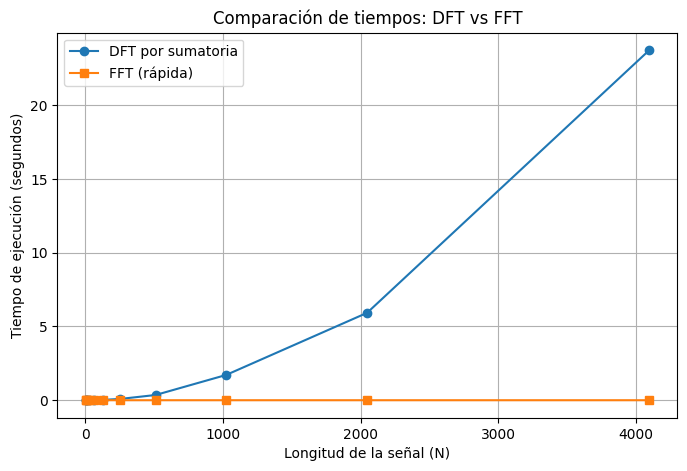

In [ ]:
import numpy as np # cálculos numéricos
import matplotlib.pyplot as plt # graficar
import time  # medir el tiempo

# FUNCIÓN DFT POR SUMATORIA (versión lenta)
def dft_naive(x):
    N = x.size # cantidad de muestras en la señal
    X = np.zeros(N, dtype=complex) # vector donde se guardará el resultado complejo
    for k in range(N):           # Recorre cada frecuencia
        s = 0+0j  # acumula el resultado, es temporal
        for n in range(N):       # Recorre cada muestra
            s += x[n] * np.exp(-2j * np.pi * k * n / N) # aplica la formula DFT
        X[k] = s   # guarda el resultado para la frecuencia k
    return X

# Vectores de tamaños a probar
N_values = [4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048, 4096] # tamaños de señales para comparar el tiempo

t_dft = []  # tiempos de la DFT por sumatoria
t_fft = []  # tiempos de la FFT rápida

# BUCLE PARA PROBAR DIFERENTES TAMAÑOS
for N in N_values:
    # Creamos una señal aleatoria (como ejemplo)
    x = np.random.rand(N) # crea señal aleatoria

    # Tiempo DFT por sumatoria
    start = time.time()      # momento antes de empezar
    X1 = dft_naive(x)        # calcula DFT
    end = time.time()        # momento al terminar
    t_dft.append(end - start) # calcula cuánto tardó y lo guarda

    # Tiempo FFT (NumPy)
    start = time.time()
    X2 = np.fft.fft(x)      # calcula la FFT
    end = time.time()
    t_fft.append(end - start)

# MOSTRAR RESULTADOS
print("Tiempos DFT (sumatoria):", t_dft)
print("Tiempos FFT:", t_fft)

# GRAFICAR COMPARACIÓN
plt.figure(figsize=(8,5))
plt.plot(N_values, t_dft, 'o-', label='DFT por sumatoria')
plt.plot(N_values, t_fft, 's-', label='FFT (rápida)')
plt.xlabel('Longitud de la señal (N)')
plt.ylabel('Tiempo de ejecución (segundos)')
plt.title('Comparación de tiempos: DFT vs FFT')
plt.legend()
plt.grid(True)
plt.show()


**Ejercicio 3:** Consulte en qué consiste la frecuencia de -3dB y su relación con las frecuencias de corte en el filtrado espectral de señales.

Cuando una señal pasa por un filtro (por ejemplo, pasa bajas, pasa altas, etc.), algunas frecuencias se dejan pasar y otras se atenúan (reducen).

La frecuencia de –3 dB es el punto donde la potencia de la señal ha disminuido a la mitad respecto a su valor máximo. En otras palabras, el filtro empieza a “cortar” o “debilitar” la señal a partir de esa frecuencia.

El decibel (dB) mide cuánta energía o amplitud se pierde o gana. Una reducción de –3 dB equivale a una pérdida de aproximadamente el 30 % en amplitud, o la mitad en potencia.


\begin{aligned}
&\text{Definición general:} &&
G_{\text{dB}} = 10 \log_{10}\left(\frac{P}{P_{\text{max}}}\right) \\[6pt]
&\text{En el punto de corte:} &&
\frac{P}{P_{\text{max}}} = 0.5 \\[6pt]
&\text{Sustituyendo:} &&
G_{\text{dB}} = 10 \log_{10}(0.5) = -3.01\,\text{dB} \\[10pt]
&\text{Relación con la amplitud:} &&
G_{\text{dB}} = 20 \log_{10}\left(\frac{A}{A_{\text{max}}}\right) \\[6pt]
&\text{En el punto de -3 dB:} &&
\frac{A}{A_{\text{max}}} = 10^{\frac{-3}{20}} \approx 0.707
\end{aligned}




En ese punto, la potencia de salida del filtro es 50 % de la potencia máxima.

En los filtros (pasa bajas, pasa altas, etc.), el valor de –3 dB se toma como la frecuencia de corte. Es el límite entre la zona donde el filtro deja pasar las frecuencias y donde empieza a atenuarlas.

Por ejemplo:

- En un filtro pasa bajas, las frecuencias por debajo del punto de –3 dB pasan casi sin cambio,
y las por encima se reducen.

- En un filtro pasa altas, ocurre lo contrario.

- En pasa banda o rechaza banda, hay dos frecuencias de corte, una inferior y una superior.

La frecuencia de –3 dB indica el punto exacto donde el filtro deja de dejar pasar libremente la señal y empieza a reducirla. Por eso se considera el límite de la banda útil del filtro.

**Ejercicio 4:** Implemente un filtro pasa bajas, un pasa altas, un pasa bandas, y un rechaza bandas utilizando la FFT y la iFFT sobre 5 segundos de su canción favorita de YouTube.

Se descargar e instala yt-dlp, una herramienta que te deja bajar videos o música de internet

In [ ]:
!python3 -m pip install https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz

  Using cached https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


## Se descarga audio de YouTube y lo guarda como un archivo mp3

Se importan las librerías necesarias

In [ ]:
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings("ignore")

In [ ]:
link = "https://www.youtube.com/watch?v=-zgDXIi1uYw&list=RDOwGG5fX7bxY&index=4" # link del video a procesar

!yt-dlp --extractor-args "youtube:player_client=android" --extract-audio -o "audio.%(ext)s" --audio-format mp3 {link} # se extrae el audio en mp3

[youtube] Extracting URL: https://www.youtube.com/watch?v=-zgDXIi1uYw
[youtube] -zgDXIi1uYw: Downloading webpage
[youtube] -zgDXIi1uYw: Downloading android player API JSON
[info] -zgDXIi1uYw: Downloading 1 format(s): 18
[download] audio.mp3 has already been downloaded
[ExtractAudio] Not converting audio audio.mp3; file is already in target format mp3


Se convierte el archivo audio.mp3 a formato output.wav

In [ ]:
!ffmpeg -y -i audio.mp3 output.wav

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

Se descarga e instala la librería soundfile para manejar archivos de audio

In [ ]:
!pip install soundfile

Se abre el archivo de audio llamado output.wav, lee su contenido, y muestra cuántas veces por segundo se tomaron las muestras del sonido (su frecuencia de muestreo).

In [ ]:
import soundfile as sf # para instalar pip install soundfile
#lee archivos wav
nombre_out = "output.wav"
x, fs = sf.read(nombre_out)
# read speech signal from file
print('Frecuencia de muestreo %.2f[Hz]\naudio %s' % (fs,nombre_out))

Frecuencia de muestreo 44100.00[Hz]
audio output.wav


El audio viene codificado en dos canales

In [ ]:
x.shape

(11860992, 2)

30 segundos de la canción a filtrar

In [ ]:
from IPython.display import Audio
ns = 30 #se reproducen los primeros ns segundos
Audio(x[:int(fs*ns),:].T,rate=fs)

Se convierte el audio del dominio del tiempo → dominio de la frecuencia, se calcula qué frecuencias están presentes y con qué intensidad

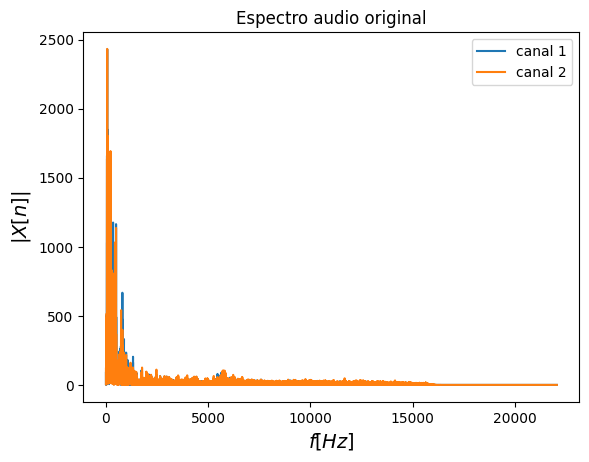

In [ ]:
Xw = np.fft.rfft(xs,axis=0) # axis=0 permite aplicar fft por cada columna de xpro
#Xwc1 = np.fft.rfft(xs[:,0])
#Xwc2 = np.fft.rfft(xs[:,1])
vf = np.fft.rfftfreq(np.size(xs,0),1/fs) #se crea el vector de frecuencias
plt.plot(vf,abs(Xw))#se grafica la magnitud
plt.legend(('canal 1','canal 2'))
plt.title(r'Espectro audio original')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|X[n]|$',fontsize = 14)
plt.show()

Filtro pasa banda

In [ ]:
Xwf = Xw.copy()
f1 = 1000 #frecuencia en Hz corte 1
f2 = 3400 #frecuencia en Hz corte 2
ind = ~((vf > f1) & (vf < f2)) #frecuencias eliminar-> recueder que ~ actua como negación
Xwf[ind,:] = 0

Se reconstruye la señal mediante la fft inversa.

In [ ]:
xe2 = np.fft.irfft(Xwf,axis=0) #fft inversa sobre los dos canales de audio

Se reproducen 5 segundos de la cancíon filtrada

In [ ]:
Audio(xe2[:int(fs*ns),:].T,rate=fs) #repoducir señal filtrada

Se grafica la señal filtrada. Eje 'x' frecuencia, eje 'y' cantidad de energía

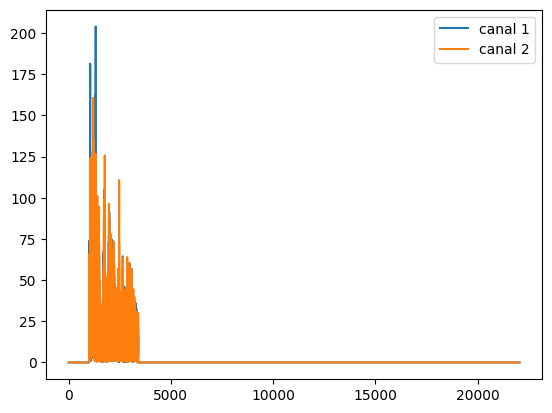

In [ ]:
plt.plot(vf,abs(Xwf))
plt.legend(('canal 1','canal 2'))
plt.show()

Filtro pasa bajas

In [ ]:
Xwf = Xw.copy()
f2 = 500  # frecuencia máxima
ind = vf > f2  # elimina las frecuencias mayores a f2
Xwf[ind, :] = 0

xe2 = np.fft.irfft(Xwf,axis=0) #fft inversa sobre los dos canales de audio
Audio(xe2[:int(fs*ns),:].T,rate=fs) #repoducir señal filtrada


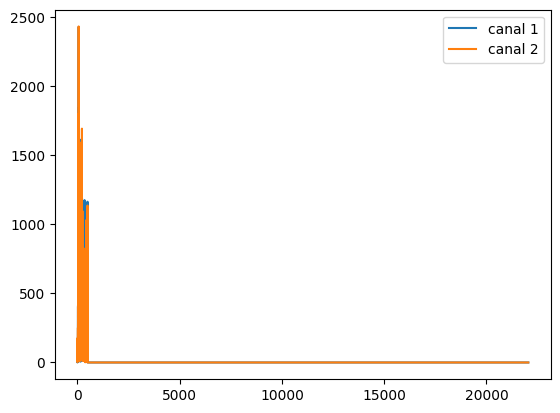

In [ ]:
plt.plot(vf,abs(Xwf))
plt.legend(('canal 1','canal 2'))
plt.show()

Filtro pasa altas

In [ ]:
Xwf = Xw.copy()
f1 = 5000  # frecuencia mínima
ind = vf < f1  # elimina las frecuencias menores a f1
Xwf[ind, :] = 0

xe2 = np.fft.irfft(Xwf,axis=0) #fft inversa sobre los dos canales de audio
Audio(xe2[:int(fs*ns),:].T,rate=fs) #repoducir señal filtrada



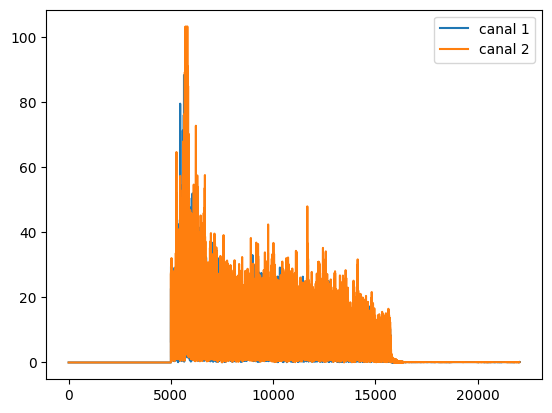

In [ ]:
plt.plot(vf,abs(Xwf))
plt.legend(('canal 1','canal 2'))
plt.show()

Filtro rechaza bandas

In [ ]:
Xwf = Xw.copy()
f1 = 5000
f2 = 15000
ind = (vf > f1) & (vf < f2)  # elimina solo las frecuencias dentro del rango
Xwf[ind, :] = 0

xe2 = np.fft.irfft(Xwf,axis=0) #fft inversa sobre los dos canales de audio
Audio(xe2[:int(fs*ns),:].T,rate=fs) #repoducir señal filtrada


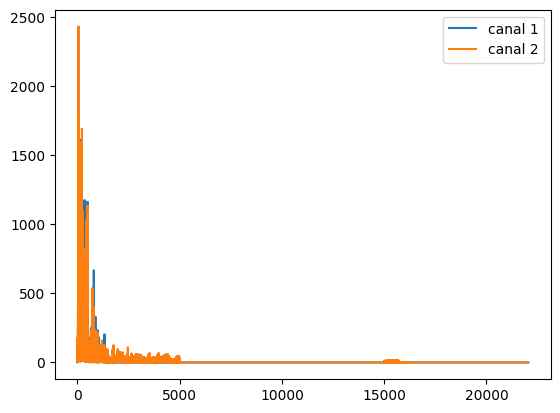

In [ ]:
plt.plot(vf,abs(Xwf))
plt.legend(('canal 1','canal 2'))
plt.show()

**Ejercicio 5:** Diseñe e implemente un detector de género musical, que permita diferenciar entre dos tipos de género. Para ello, construya una base de datos con al menos 50 registros por género musical, de 5 segundos cada uno, y luego implemente un código que permita recibir un nuevo registro músical de 5 segundos para detectar el género de la canción a partir de los vecinos más cercanos según la distancia Euclídea entre la magnitud del espectro de Fourier del nuevo registro (ver [clasificador KNN](https://en.wikipedia.org/wiki/K-nearest_neighbors_algorithm)), y las magnitudes de los espectros de la base de datos construida (Ver [Cuaderno YouTube Download/Detector](https://github.com/amalvarezme/SenalesSistemas/blob/master/3_SerieyTransformadaFourier/youtube_detector.ipynb)).